In [2]:
import os
import xarray as xr
import numpy as np
import xesmf as xe
import pandas as pd
from datetime import datetime, timedelta
import seaborn as sns
from collections import OrderedDict

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
from score import *

In [5]:
import pickle
def to_pickle(obj, fn):
    with open(fn, 'wb') as f:
        pickle.dump(obj, f)
def read_pickle(fn):
    with open(fn, 'rb') as f:
        return pickle.load(f)

In [6]:
def convert_time(ds, nlead_time, dt_h=6):
    """Converts to lead_time format"""
    init_times = ds.time[::nlead_time]
    lead_times = xr.DataArray(
        np.arange(0, dt_h*nlead_time, dt_h), dims=['lead_time'], coords={'lead_time': np.arange(0, dt_h*nlead_time, dt_h)})
    
    coords = dict(ds.coords); coords.pop('time')
    coords['time'] = init_times; coords['lead_time'] = lead_times
    ds_by_lead = xr.merge([xr.DataArray(
        ds[var].values.reshape((len(init_times), len(lead_times)) + ds[var].shape[1:]),
        dims = ('time', 'lead_time') + ds[var].dims[1:],
        coords = coords,
        name=var
    ) for var in ds])
    return ds_by_lead

In [7]:
def fix_lat_lon(ds):
    "Not necessary for current version"
    ds = ds.sortby('lat')
    ds['lat'] = valid_data.lat
    ds = ds.roll(lon=32, roll_coords='lon')
    ds['lon'] = valid_data.lon
    return ds

In [8]:
def convert_time(ds, nlead_time, dt_h=6):
    """Converts to lead_time format"""
    init_times = ds.time[::nlead_time]
    lead_times = xr.DataArray(
        np.arange(0, dt_h*nlead_time, dt_h), dims=['lead_time'], coords={'lead_time': np.arange(0, dt_h*nlead_time, dt_h)})
    
    coords = dict(ds.coords); coords.pop('time')
    coords['time'] = init_times; coords['lead_time'] = lead_times
    ds_by_lead = xr.merge([xr.DataArray(
        ds[var].values.reshape((len(init_times), len(lead_times)) + ds[var].shape[1:]),
        dims = ('time', 'lead_time') + ds[var].dims[1:],
        coords = coords,
        name=var
    ) for var in ds])
    return ds_by_lead

def fix_lat_lon(ds):
    "Not necessary for current version"
    ds = ds.sortby('lat')
    ds['lat'] = valid_ds.lat
    ds = ds.roll(lon=32, roll_coords='lon')
    ds['lon'] = valid_ds.lon
    return ds

In [9]:
import cartopy.crs as ccrs
sns.set_style('dark')

In [10]:
cmap_z = 'cividis'
cmap_t = 'RdYlBu_r'
cmap_diff = 'bwr'
cmap_error = 'BrBG'

def imcol(ax, data, title='', **kwargs):
    if not 'vmin' in kwargs.keys():
        mx = np.abs(data.quantile(0.995).values)*2
        kwargs['vmin'] = -mx; kwargs['vmax'] = mx
    #I = ax.imshow(data, origin='lower', transform=ccrs.PlateCarree(), **kwargs)
    I = data.plot.imshow(ax=ax, transform=ccrs.PlateCarree(), add_colorbar=False, add_labels=False, **kwargs)
    cb = fig.colorbar(I, ax=ax, orientation='horizontal', pad=0.01, shrink=0.90)
    ax.coastlines(alpha=0.5)
    ax.set_title(title)

In [11]:
colors = {
    'PredRNN_new': '#984ea3',
    'IFS T42': '#4daf4a',
    'IFS T63': '#377eb8',
    'PredRNN': '#e41a1c',
}

def create_plot(score, var, save_fn=None, ax=None, legend=False, ylabel=None, title=None, ylim=None, mult_tp=1., xlim=None):
    if ax is None: 
        fig, ax = plt.subplots(1, 1, figsize=(5, 4)) 
    for exp, ds in score.items():
        s = ds.copy(deep=True)
        if var in s.variables:
            if var == 'tp': s[var] *= mult_tp
            if exp in ['Climatology', 'Weekly clim.']:
                ax.axhline(s[var], ls='--', c=colors[exp], label=exp, lw=3)
            elif 'direct' in exp:
                ax.scatter(s['lead_time'], s[var], c=colors[exp], s=100, label=exp, lw=2, edgecolors='k', zorder=10)
            else:
                s[var].plot(c=colors[exp], label=exp, lw=3, ax=ax)
            
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.set_ylim(ylim)
    if xlim is not None:
        ax.set_xlim(xlim)
        ax.set_xticks(np.arange(0,xlim[1]+1,24))
        ax.set_xticklabels([x//24 for x in np.arange(0,xlim[1]+1,24)])
    ax.set_xlabel('Forecast time [days]')
    
    if not save_fn is None: 
        plt.subplots_adjust(left=0.15, right=0.95, top=0.9, bottom=0.1)
        fig.savefig(save_fn)

## 0.25 degree

In [12]:
in_dir = '/work/08589/hvtran/ls6/ERA5_PredRNN-main/predrnn-pytorch/checkpoints/2012_predrnn_test/test_result/'
out_dir = '/scratch/08589/hvtran/PredRNN_Sandy/raw/'
start_date = datetime(2012,10,23,0)
step = 14
n_lead_time = 336
#list_batchs = sorted([name for name in os.listdir(in_dir) if os.path.isdir(os.path.join(in_dir, name))])
n_batchs = 1
out_pd_file = out_dir+'prediction_'+start_date.strftime('%Y%m%d%H')+\
                '_'+str(n_lead_time)+'.'+'202210191342'+'.nc'
out_gt_file = out_dir+'truth_'+start_date.strftime('%Y%m%d%H')+\
                '_'+str(n_lead_time)+'.'+'202210191342'+'.nc'


In [13]:
in_dir = '/work/08589/hvtran/ls6/ERA5_PredRNN-main/predrnn-pytorch/checkpoints/2012_predrnn_test_new/test_result/'
out_dir = '/scratch/08589/hvtran/PredRNN_Sandy/raw/'
start_date = datetime(2012,10,23,0)
step = 14
n_lead_time = 336
#list_batchs = sorted([name for name in os.listdir(in_dir) if os.path.isdir(os.path.join(in_dir, name))])
n_batchs = 1
out_pd_file = out_dir+'prediction_'+start_date.strftime('%Y%m%d%H')+\
                '_'+str(n_lead_time)+'.'+'202211291943'+'.nc'
out_gt_file = out_dir+'truth_'+start_date.strftime('%Y%m%d%H')+\
                '_'+str(n_lead_time)+'.'+'202211291943'+'.nc'


In [14]:
#Load data
valid_ds = xr.open_dataset(out_gt_file)
#pred_ds_old = xr.open_dataset(out_pd_file_old)
#pred_ds_old = pred_ds_old.isel(lead_time=slice(0, None, 6))
pred_ds = xr.open_dataset(out_pd_file)
pred_ds = pred_ds.isel(lead_time=slice(0, None, 6))
print(valid_ds, pred_ds)

<xarray.Dataset>
Dimensions:    (time: 336, lat: 720, lon: 1440)
Coordinates:
  * lon        (lon) float64 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8
  * lat        (lat) float64 90.0 89.75 89.5 89.25 ... -89.0 -89.25 -89.5 -89.75
  * time       (time) datetime64[ns] 2012-10-23 ... 2012-11-05T23:00:00
Data variables:
    sea_press  (time, lat, lon) float32 ... <xarray.Dataset>
Dimensions:    (time: 1, lead_time: 56, lat: 720, lon: 1440)
Coordinates:
  * lon        (lon) float64 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8
  * lat        (lat) float64 90.0 89.75 89.5 89.25 ... -89.0 -89.25 -89.5 -89.75
  * lead_time  (lead_time) float64 0.0 6.0 12.0 18.0 ... 312.0 318.0 324.0 330.0
  * time       (time) datetime64[ns] 2012-10-23
Data variables:
    sea_press  (time, lead_time, lat, lon) float32 ...


In [15]:
PREDDIR='/work/08589/hvtran/ls6/ERA5_PredRNN-main/validation/'

func = compute_weighted_rmse
rmse = OrderedDict({
    'PredRNN': evaluate_iterative_forecast(pred_ds, valid_ds, func).load(),
})

to_pickle(rmse, f'{PREDDIR}rmse1.pkl')


func = compute_weighted_acc
acc = OrderedDict({
    'PredRNN': evaluate_iterative_forecast(pred_ds, valid_ds, func).load(),
})

to_pickle(acc, f'{PREDDIR}acc1.pkl')

func = compute_weighted_mae
mae = OrderedDict({
    'PredRNN': evaluate_iterative_forecast(pred_ds, valid_ds, func).load(),
})

to_pickle(mae, f'{PREDDIR}mae1.pkl')

In [16]:
PREDDIR='/work/08589/hvtran/ls6/ERA5_PredRNN-main/validation/'
rmse_old = read_pickle(f'{PREDDIR}rmse1.pkl')
acc_old = read_pickle(f'{PREDDIR}acc1.pkl')
mae_old = read_pickle(f'{PREDDIR}mae1.pkl')
rmse = read_pickle(f'{PREDDIR}rmse_new.pkl')
acc = read_pickle(f'{PREDDIR}acc_new.pkl')
mae = read_pickle(f'{PREDDIR}mae_new.pkl')

In [17]:
print(rmse)

OrderedDict([('PredRNN', <xarray.Dataset>
Dimensions:    (lead_time: 56)
Coordinates:
  * lead_time  (lead_time) float64 0.0 6.0 12.0 18.0 ... 312.0 318.0 324.0 330.0
Data variables:
    u10        (lead_time) float64 0.06196 0.0643 0.06187 ... 5.765 5.914
    v10        (lead_time) float64 0.0612 0.06342 0.06112 ... 5.616 5.768
    t2m        (lead_time) float64 0.291 0.3018 0.2907 ... 0.3042 4.837 4.854
    sea_press  (lead_time) float64 21.4 22.21 21.37 ... 22.37 1.033e+03 1.04e+03
    tp         (lead_time) float64 1.747e-05 1.816e-05 ... 0.0006361 0.0006431
    tcwv       (lead_time) float64 0.6119 0.6419 0.6124 ... 0.6428 8.955 8.896)])


In [18]:
rmse_all = OrderedDict({
    'PredRNN': rmse_old['PredRNN'],
    'PredRNN_new': rmse['PredRNN'],
})
acc_all = OrderedDict({
    'PredRNN': acc_old['PredRNN'],
    'PredRNN_new': acc['PredRNN'],
})
mae_all = OrderedDict({
    'PredRNN': mae_old['PredRNN'],
    'PredRNN_new': mae['PredRNN'],
})

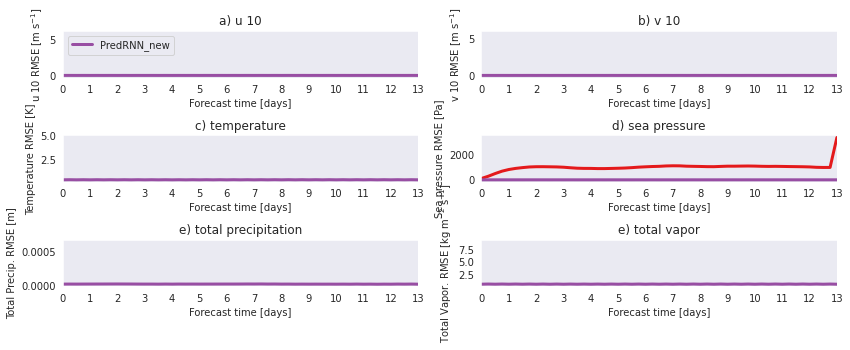

In [19]:
fig, axs = plt.subplots(3, 2, figsize=(12, 4.5))
ax1, ax2, ax3, ax4, ax5, ax6 = axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1]
create_plot(rmse_all, 'u10', ax=ax1, ylabel=r'u 10 RMSE [m s$^{-1}$]', title='a) u 10', xlim=(0, 312))
create_plot(rmse_all, 'v10', ax=ax2, ylabel=r'v 10 RMSE [m s$^{-1}$]', title='b) v 10', xlim=(0, 312))
create_plot(rmse_all, 't2m', ax=ax3, ylabel=r'Temperature RMSE [K]', 
            title='c) temperature', xlim=(0, 312))
create_plot(rmse_all, 'sea_press', ax=ax4, ylabel=r'Sea pressure RMSE [Pa]', 
            title='d) sea pressure', xlim=(0, 312))
create_plot(rmse_all, 'tp', ax=ax5, ylabel=r'Total Precip. RMSE [m]', 
            title='e) total precipitation', xlim=(0, 312))
create_plot(rmse_all, 'tcwv', ax=ax6, ylabel=r'Total Vapor. RMSE [kg m$^{-2}$ s$^{-1}$]', 
            title='e) total vapor', xlim=(0, 312))
ax1.legend(loc=2, ncol=1, fontsize=10)
plt.tight_layout()

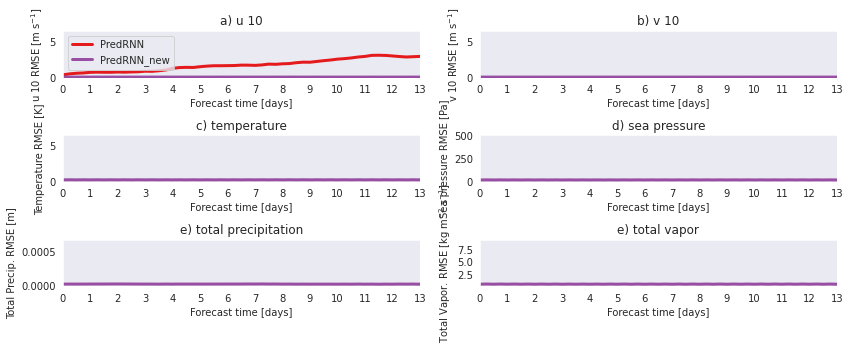

In [20]:
fig, axs = plt.subplots(3, 2, figsize=(12, 4.5))
ax1, ax2, ax3, ax4, ax5, ax6 = axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1]
create_plot(rmse_all, 'u10', ax=ax1, ylabel=r'u 10 RMSE [m s$^{-1}$]', title='a) u 10', ylim=(0, 6.5), xlim=(0, 312))
create_plot(rmse_all, 'v10', ax=ax2, ylabel=r'v 10 RMSE [m s$^{-1}$]', title='b) v 10', ylim=(0, 6.5), xlim=(0, 312))
create_plot(rmse_all, 't2m', ax=ax3, ylabel=r'Temperature RMSE [K]', 
            title='c) temperature', ylim=(0, 6.5), xlim=(0, 312))
create_plot(rmse_all, 'sea_press', ax=ax4, ylabel=r'Sea pressure RMSE [Pa]', 
            title='d) sea pressure', ylim=(0, 500), xlim=(0, 312))
create_plot(rmse_all, 'tp', ax=ax5, ylabel=r'Total Precip. RMSE [m]', 
            title='e) total precipitation', xlim=(0, 312))
create_plot(rmse_all, 'tcwv', ax=ax6, ylabel=r'Total Vapor. RMSE [kg m$^{-2}$ s$^{-1}$]', 
            title='e) total vapor', xlim=(0, 312))
ax1.legend(loc=2, ncol=1, fontsize=10)
plt.tight_layout()
plt.savefig('RMSE_compare.png',dpi=250)

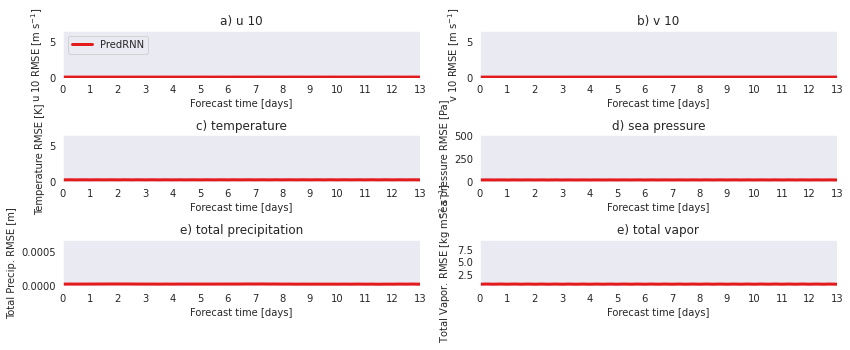

In [57]:
fig, axs = plt.subplots(3, 2, figsize=(12, 4.5))
ax1, ax2, ax3, ax4, ax5, ax6 = axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1]
create_plot(rmse, 'u10', ax=ax1, ylabel=r'u 10 RMSE [m s$^{-1}$]', title='a) u 10', ylim=(0, 6.5), xlim=(0, 312))
create_plot(rmse, 'v10', ax=ax2, ylabel=r'v 10 RMSE [m s$^{-1}$]', title='b) v 10', ylim=(0, 6.5), xlim=(0, 312))
create_plot(rmse, 't2m', ax=ax3, ylabel=r'Temperature RMSE [K]', 
            title='c) temperature', ylim=(0, 6.5), xlim=(0, 312))
create_plot(rmse, 'sea_press', ax=ax4, ylabel=r'Sea pressure RMSE [Pa]', 
            title='d) sea pressure', ylim=(0, 500), xlim=(0, 312))
create_plot(rmse, 'tp', ax=ax5, ylabel=r'Total Precip. RMSE [m]', 
            title='e) total precipitation', xlim=(0, 312))
create_plot(rmse, 'tcwv', ax=ax6, ylabel=r'Total Vapor. RMSE [kg m$^{-2}$ s$^{-1}$]', 
            title='e) total vapor', xlim=(0, 312))
ax1.legend(loc=2, ncol=1, fontsize=10)
plt.tight_layout()
#plt.savefig('RMSE.png',dpi=50)

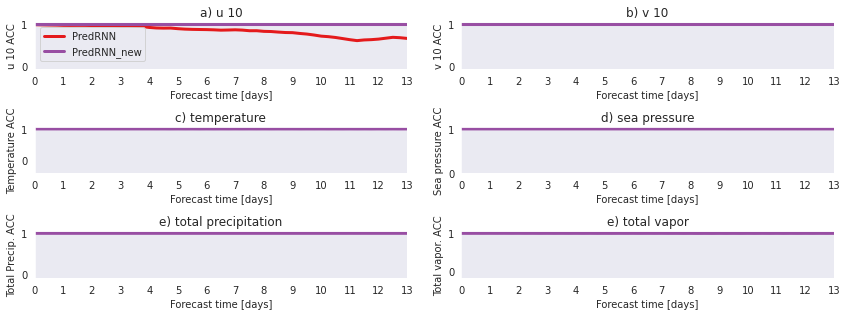

In [21]:
#  latitude weighted anomaly correlation coefficient
fig, axs = plt.subplots(3, 2, figsize=(12, 4.5))
ax1, ax2, ax3, ax4, ax5, ax6 = axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1]
create_plot(acc_all, 'u10', ax=ax1, ylabel=r'u 10 ACC', title='a) u 10', xlim=(0, 312))
create_plot(acc_all, 'v10', ax=ax2, ylabel=r'v 10 ACC', title='b) v 10', xlim=(0, 312))
create_plot(acc_all, 't2m', ax=ax3, ylabel=r'Temperature ACC', 
            title='c) temperature', xlim=(0, 312))
create_plot(acc_all, 'sea_press', ax=ax4, ylabel=r'Sea pressure ACC', 
            title='d) sea pressure', xlim=(0, 312))
create_plot(acc_all, 'tp', ax=ax5, ylabel=r'Total Precip. ACC', 
            title='e) total precipitation', xlim=(0, 312))
create_plot(acc_all, 'tcwv', ax=ax6, ylabel=r'Total vapor. ACC', 
            title='e) total vapor', xlim=(0, 312))
ax1.legend(loc=2, ncol=1, fontsize=10)
plt.tight_layout()
plt.savefig('ACC_compare.png',dpi=250)

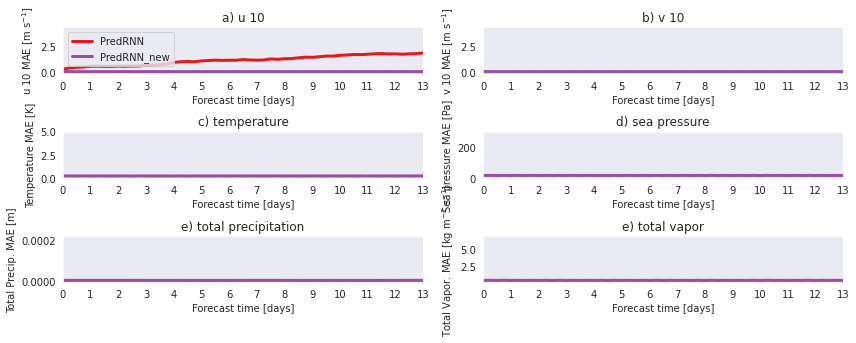

In [22]:
fig, axs = plt.subplots(3, 2, figsize=(12, 4.5))
ax1, ax2, ax3, ax4, ax5, ax6 = axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1]
create_plot(mae_all, 'u10', ax=ax1, ylabel=r'u 10 MAE [m s$^{-1}$]', title='a) u 10', xlim=(0, 312))
create_plot(mae_all, 'v10', ax=ax2, ylabel=r'v 10 MAE [m s$^{-1}$]', title='b) v 10', xlim=(0, 312))
create_plot(mae_all, 't2m', ax=ax3, ylabel=r'Temperature MAE [K]', 
            title='c) temperature', ylim=(0, 5), xlim=(0, 312))
create_plot(mae_all, 'sea_press', ax=ax4, ylabel=r'Sea pressure MAE [Pa]', 
            title='d) sea pressure', ylim=(0, 300), xlim=(0, 312))
create_plot(mae_all, 'tp', ax=ax5, ylabel=r'Total Precip. MAE [m]', 
            title='e) total precipitation', xlim=(0, 312))
create_plot(mae_all, 'tcwv', ax=ax6, ylabel=r'Total Vapor. MAE [kg m$^{-2}$ s$^{-1}$]', 
            title='e) total vapor', xlim=(0, 312))
ax1.legend(loc=2, ncol=1, fontsize=10)
plt.tight_layout()
plt.savefig('MAE_compare.png', dpi=250)

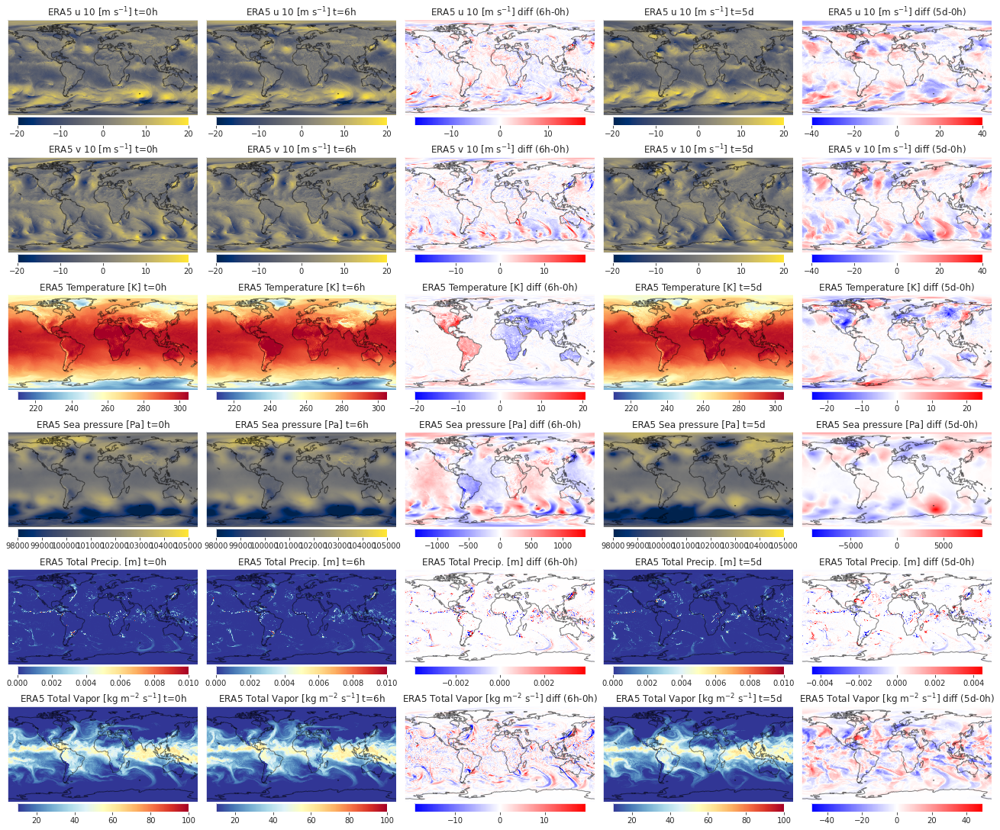

In [18]:
# True
fig, axs = plt.subplots(6, 5, figsize=(18, 15), subplot_kw={'projection': ccrs.PlateCarree()})

# True
for iax, var, cmap, r, t in zip(
    [0, 1, 2, 3, 4, 5], ['u10', 'v10', 't2m', 'sea_press', 'tp', 'tcwv'], 
    [cmap_z, cmap_z, cmap_t, cmap_z, cmap_t, cmap_t], 
    [[-20,20], [-20,20], [210,305], [98000,105000], [0,1e-2], [10,1e2]],
    [r'u 10 [m s$^{-1}$]', 'v 10 [m s$^{-1}$]', 'Temperature [K]',
    'Sea pressure [Pa]', 'Total Precip. [m]',
    'Total Vapor [kg m$^{-2}$ s$^{-1}$]']):
    imcol(axs[iax,0], valid_ds[var].isel(time=0), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'ERA5 {t} t=0h')
    imcol(axs[iax,1], valid_ds[var].isel(time=6), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'ERA5 {t} t=6h')
    imcol(axs[iax,2],
        valid_ds[var].isel(time=6)-valid_ds[var].isel(time=0), cmap=cmap_diff, 
        title=f'ERA5 {t} diff (6h-0h)')
    imcol(axs[iax,3], valid_ds[var].isel(time=5*24), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'ERA5 {t} t=5d')
    imcol(axs[iax,4], 
        valid_ds[var].isel(time=5*24)-valid_ds[var].isel(time=0), cmap=cmap_diff, 
        title=f'ERA5 {t} diff (5d-0h)')

for ax in axs.flat:
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(pad=0)

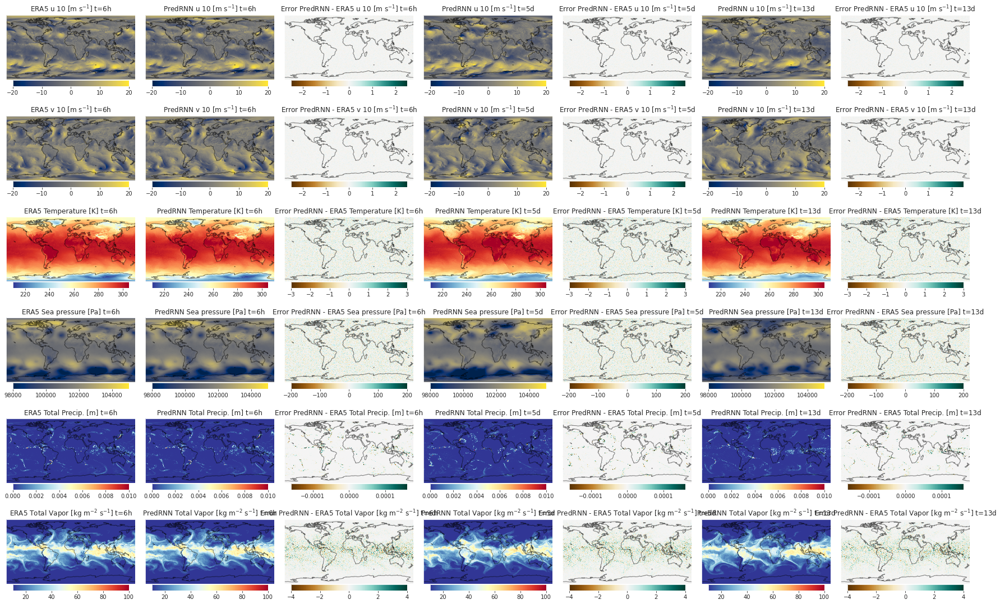

In [71]:
# PredRNN
fig, axs = plt.subplots(6, 7, figsize=(24, 15), subplot_kw={'projection': ccrs.PlateCarree()})

for iax, var, cmap, r, t, diff_cmap in zip(
    [0, 1, 2, 3, 4, 5], ['u10', 'v10', 't2m', 'sea_press', 'tp', 'tcwv'], 
    [cmap_z, cmap_z, cmap_t, cmap_z, cmap_t, cmap_t], 
    [[-20,20], [-20,20], [210,305], [98000,105000], [0,1e-2], [10,1e2]], 
    [r'u 10 [m s$^{-1}$]', 'v 10 [m s$^{-1}$]', 'Temperature [K]',
    'Sea pressure [Pa]', 'Total Precip. [m]',
    'Total Vapor [kg m$^{-2}$ s$^{-1}$]'],
    [[-2.5,2.5],[-2.5,2.5],[-3,3],[-200,200],[-0.00016,0.00016],[-4,4]]):
    imcol(axs[iax,0], valid_ds[var].isel(time=6), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'ERA5 {t} t=6h')
    imcol(axs[iax,1], pred_ds[var].isel(time=0).sel(lead_time=6), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'PredRNN {t} t=6h')
    imcol(axs[iax,2], 
          pred_ds[var].isel(time=0).sel(lead_time=6)-valid_ds[var].isel(time=6), cmap=cmap_error,
          vmin=diff_cmap[0],vmax=diff_cmap[1],
          title=f'Error PredRNN - ERA5 {t} t=6h')
    imcol(axs[iax,3], pred_ds[var].isel(time=0).sel(lead_time=5*24), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'PredRNN {t} t=5d')
    imcol(axs[iax,4], 
          pred_ds[var].isel(time=0).sel(lead_time=5*24) - valid_ds[var].isel(time=5*24), cmap=cmap_error,
          vmin=diff_cmap[0],vmax=diff_cmap[1],
          title=f'Error PredRNN - ERA5 {t} t=5d')
    imcol(axs[iax,5], pred_ds[var].isel(time=0).sel(lead_time=13*24), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'PredRNN {t} t=13d')
    imcol(axs[iax,6], 
          pred_ds[var].isel(time=0).sel(lead_time=13*24) - valid_ds[var].isel(time=13*24), cmap=cmap_error,
          vmin=diff_cmap[0],vmax=diff_cmap[1],
          title=f'Error PredRNN - ERA5 {t} t=13d')
    
for ax in axs.flat:
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(pad=0)
plt.savefig('global_error_new.png',dpi=300)

In [61]:
min_lon = 180+90
min_lat = 20.0 
max_lon = 180+135
max_lat = 50.55 

crop_valid_ds = valid_ds.sel(lat=slice(max_lat,min_lat), lon=slice(min_lon,max_lon))
crop_pred_ds = pred_ds.sel(lat=slice(max_lat,min_lat), lon=slice(min_lon,max_lon))
crop_pred_ds_old = pred_ds_old.sel(lat=slice(max_lat,min_lat), lon=slice(min_lon,max_lon))

In [62]:
crop_valid_ds['lon'] = crop_valid_ds['lon'] - 360
crop_pred_ds['lon'] = crop_pred_ds['lon'] - 360
crop_pred_ds_old['lon'] = crop_pred_ds_old['lon'] - 360

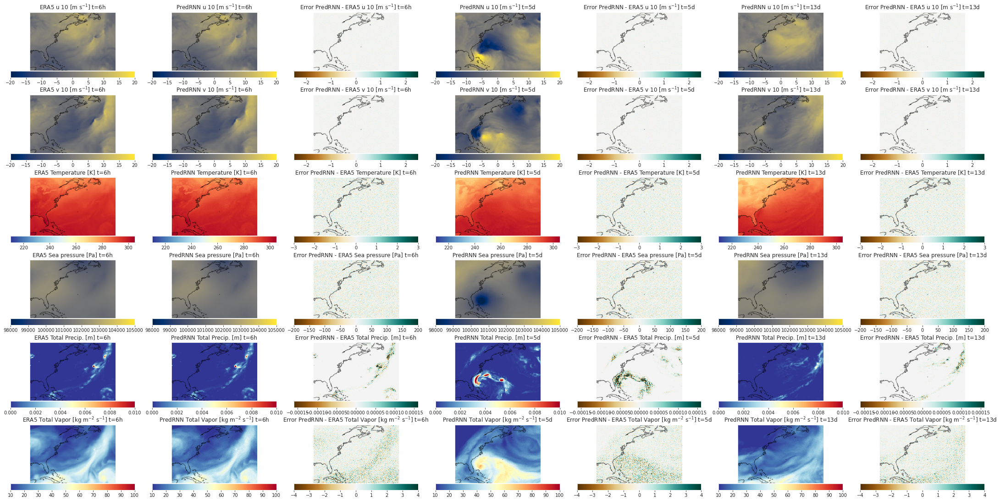

In [67]:
# PredRNN
fig, axs = plt.subplots(6, 7, figsize=(30, 15), subplot_kw={'projection': ccrs.PlateCarree()})

for iax, var, cmap, r, t, diff_cmap in zip(
    [0, 1, 2, 3, 4, 5], ['u10', 'v10', 't2m', 'sea_press', 'tp', 'tcwv'], 
    [cmap_z, cmap_z, cmap_t, cmap_z, cmap_t, cmap_t], 
    [[-20,20], [-20,20], [210,305], [98000,105000], [0,1e-2], [10,100]], 
    [r'u 10 [m s$^{-1}$]', 'v 10 [m s$^{-1}$]', 'Temperature [K]',
    'Sea pressure [Pa]', 'Total Precip. [m]',
    'Total Vapor [kg m$^{-2}$ s$^{-1}$]'],
    [[-2.5,2.5],[-2.5,2.5],[-3,3],[-200,200],[-0.00016,0.00016],[-4,4]]):
    imcol(axs[iax,0], crop_valid_ds[var].isel(time=6), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'ERA5 {t} t=6h')
    imcol(axs[iax,1], crop_pred_ds[var].isel(time=0).sel(lead_time=6), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'PredRNN {t} t=6h')
    imcol(axs[iax,2], 
          crop_pred_ds[var].isel(time=0).sel(lead_time=6)-crop_valid_ds[var].isel(time=6), cmap=cmap_error,
          vmin=diff_cmap[0],vmax=diff_cmap[1],
          title=f'Error PredRNN - ERA5 {t} t=6h')
    imcol(axs[iax,3], crop_pred_ds[var].isel(time=0).sel(lead_time=5*24), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'PredRNN {t} t=5d')
    imcol(axs[iax,4], 
          crop_pred_ds[var].isel(time=0).sel(lead_time=5*24) - crop_valid_ds[var].isel(time=5*24), cmap=cmap_error,
          vmin=diff_cmap[0],vmax=diff_cmap[1],
          title=f'Error PredRNN - ERA5 {t} t=5d')
    imcol(axs[iax,5], crop_pred_ds[var].isel(time=0).sel(lead_time=13*24), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'PredRNN {t} t=13d')
    imcol(axs[iax,6], 
          crop_pred_ds[var].isel(time=0).sel(lead_time=13*24) - crop_valid_ds[var].isel(time=13*24), cmap=cmap_error,
          vmin=diff_cmap[0],vmax=diff_cmap[1],
          title=f'Error PredRNN - ERA5 {t} t=13d')
    
for ax in axs.flat:
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(pad=0)
plt.savefig('zoom_new.png',dpi=300)

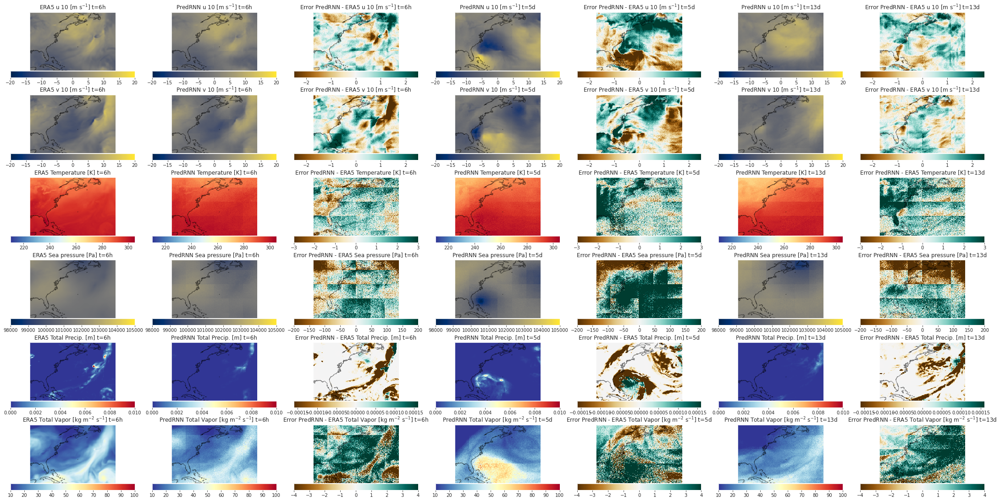

In [68]:
# PredRNN
fig, axs = plt.subplots(6, 7, figsize=(30, 15), subplot_kw={'projection': ccrs.PlateCarree()})

for iax, var, cmap, r, t, diff_cmap in zip(
    [0, 1, 2, 3, 4, 5], ['u10', 'v10', 't2m', 'sea_press', 'tp', 'tcwv'], 
    [cmap_z, cmap_z, cmap_t, cmap_z, cmap_t, cmap_t], 
    [[-20,20], [-20,20], [210,305], [98000,105000], [0,1e-2], [10,100]], 
    [r'u 10 [m s$^{-1}$]', 'v 10 [m s$^{-1}$]', 'Temperature [K]',
    'Sea pressure [Pa]', 'Total Precip. [m]',
    'Total Vapor [kg m$^{-2}$ s$^{-1}$]'],
    [[-2.5,2.5],[-2.5,2.5],[-3,3],[-200,200],[-0.00016,0.00016],[-4,4]]):
    imcol(axs[iax,0], crop_valid_ds[var].isel(time=6), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'ERA5 {t} t=6h')
    imcol(axs[iax,1], crop_pred_ds_old[var].isel(time=0).sel(lead_time=6), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'PredRNN {t} t=6h')
    imcol(axs[iax,2], 
          crop_pred_ds_old[var].isel(time=0).sel(lead_time=6)-crop_valid_ds[var].isel(time=6), cmap=cmap_error,
          vmin=diff_cmap[0],vmax=diff_cmap[1],
          title=f'Error PredRNN - ERA5 {t} t=6h')
    imcol(axs[iax,3], crop_pred_ds_old[var].isel(time=0).sel(lead_time=5*24), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'PredRNN {t} t=5d')
    imcol(axs[iax,4], 
          crop_pred_ds_old[var].isel(time=0).sel(lead_time=5*24) - crop_valid_ds[var].isel(time=5*24), cmap=cmap_error,
          vmin=diff_cmap[0],vmax=diff_cmap[1],
          title=f'Error PredRNN - ERA5 {t} t=5d')
    imcol(axs[iax,5], crop_pred_ds_old[var].isel(time=0).sel(lead_time=13*24), cmap=cmap, 
          vmin=r[0], vmax=r[1], title=f'PredRNN {t} t=13d')
    imcol(axs[iax,6], 
          crop_pred_ds_old[var].isel(time=0).sel(lead_time=13*24) - crop_valid_ds[var].isel(time=13*24), cmap=cmap_error,
          vmin=diff_cmap[0],vmax=diff_cmap[1],
          title=f'Error PredRNN - ERA5 {t} t=13d')
    
for ax in axs.flat:
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(pad=0)
plt.savefig('zoom_old.png',dpi=300)

In [11]:
var_dict = {'u_wind':'u10', 'v_wind':'v10', 'temp': 't2m', 'sea_press': 'sea_press', 'precip':'tp', 'vapor':'tcwv'}
lon = np.arange(0,360,0.25)
lat = np.arange(-89.75,90.1,0.25)[::-1]

def write_netcdf(datas,var_dict,lon,lat,start_time):
    data_vars = {
            var_dict['u_wind'] : (["time","lat","lon"], datas[var_dict['u_wind']].data),
            var_dict['v_wind'] :(["time","lat","lon"], datas[var_dict['v_wind']].data),
            var_dict['temp']: (["time","lat","lon"], datas[var_dict['temp']].data),
            var_dict['sea_press'] :(["time","lat","lon"], datas[var_dict['sea_press']].data),
            var_dict['precip'] : (["time","lat","lon"], datas[var_dict['precip']].data),
            var_dict['vapor'] : (["time","lat","lon"], datas[var_dict['vapor']].data),
    }
    coords = {
        "lon": lon,
        "lat": lat,
        "time": start_time
    }
    ds = xr.Dataset(data_vars = data_vars, coords = coords)
    return ds

In [12]:
out_pd_file = '/scratch/08589/hvtran/PredRNN_Sandy/raw/prediction_2012102112_2_336.202209061323.nc'
pred_ds = xr.open_dataset(out_pd_file)
for ii,timei in enumerate(pred_ds.time):
    start_date = datetime.utcfromtimestamp(timei.values.astype(int)*1e-9)
    out_name = out_pd_file.replace('.nc','_t0_'+start_date.strftime('%Y%m%d%H')+'.nc')
    print(out_name)
    start_time = pd.date_range(start_date, periods=pred_ds.lead_time.shape[0], freq='H')
    start_time = np.array([(x - datetime(2001,1,1,0)).total_seconds()/3600. for x in start_time])
    temp_ds = pred_ds.isel(time=ii)
    sel_pd_ds = write_netcdf(temp_ds,var_dict,lon,lat,start_time)
    sel_pd_ds.time.attrs['units']='hours since 2001-01-01 00:00:00'
    sel_pd_ds.time.attrs['calendar']='standard'
    sel_pd_ds.time.encoding['units'] = 'hours since 2001-01-01 00:00:00'
    sel_pd_ds.to_netcdf(out_name)

/scratch/08589/hvtran/PredRNN_Sandy/raw/prediction_2012102112_2_336.202209061323_t0_2012102112.nc
/scratch/08589/hvtran/PredRNN_Sandy/raw/prediction_2012102112_2_336.202209061323_t0_2012102200.nc
